In [1]:
!nvidia-smi

/bin/bash: nvidia-smi: command not found


In [2]:
!pip install h2o

     |████████████████████████████████| 176.0 MB 5.8 kB/s 
  Created wheel for h2o: filename=h2o-3.36.0.2-py2.py3-none-any.whl size=176112127 sha256=5ebced31f334953122af0cf6f49dbad58383c1dbfbc582d85f1913faebad428e
  Stored in directory: /root/.cache/pip/wheels/0b/83/bd/343a6140119b4098103e725e1cfe9f198568d13cf103acbc7c
Successfully built h2o


In [3]:
!apt-get install default-jre
!java -version

Reading package lists... Done
Building dependency tree       
Reading state information... Done
default-jre is already the newest version (2:1.11-68ubuntu1~18.04.1).
default-jre set to manually installed.
The following packages were automatically installed and are no longer required:
  cuda-command-line-tools-10-0 cuda-command-line-tools-10-1
  cuda-command-line-tools-11-0 cuda-compiler-10-0 cuda-compiler-10-1
  cuda-compiler-11-0 cuda-cuobjdump-10-0 cuda-cuobjdump-10-1
  cuda-cuobjdump-11-0 cuda-cupti-10-0 cuda-cupti-10-1 cuda-cupti-11-0
  cuda-cupti-dev-11-0 cuda-documentation-10-0 cuda-documentation-10-1
  cuda-documentation-11-0 cuda-documentation-11-1 cuda-gdb-10-0 cuda-gdb-10-1
  cuda-gdb-11-0 cuda-gpu-library-advisor-10-0 cuda-gpu-library-advisor-10-1
  cuda-libraries-10-0 cuda-libraries-10-1 cuda-libraries-11-0
  cuda-memcheck-10-0 cuda-memcheck-10-1 cuda-memcheck-11-0 cuda-nsight-10-0
  cuda-nsight-10-1 cuda-nsight-11-0 cuda-nsight-11-1 cuda-nsight-compute-10-0
  cuda-nsight-c

In [4]:
import h2o
from h2o.automl import H2OAutoML
import random, os, sys
from datetime import datetime
import pandas as pd
import logging
import csv
import optparse
import time
import json
from distutils.util import strtobool
import psutil
import numpy as np
import matplotlib.pyplot as plt
!pip install dataprep
from dataprep.eda import create_report
import h2o
from h2o.estimators.random_forest import H2ORandomForestEstimator
from h2o.estimators.gbm import H2OGradientBoostingEstimator
from h2o.estimators.stackedensemble import H2OStackedEnsembleEstimator
h2o.init()


     |████████████████████████████████| 3.5 MB 4.2 MB/s 
     |████████████████████████████████| 1.5 MB 24.1 MB/s 
     |████████████████████████████████| 943 kB 56.8 MB/s 
     |████████████████████████████████| 1.1 MB 59.8 MB/s 
     |████████████████████████████████| 10.9 MB 29.1 MB/s 
     |████████████████████████████████| 63 kB 1.9 MB/s 
     |████████████████████████████████| 366 kB 45.9 MB/s 
     |████████████████████████████████| 848 kB 40.0 MB/s 
     |████████████████████████████████| 719 kB 37.5 MB/s 
     |████████████████████████████████| 158 kB 39.5 MB/s 
     |████████████████████████████████| 144 kB 44.7 MB/s 
     |████████████████████████████████| 271 kB 48.1 MB/s 
     |████████████████████████████████| 94 kB 2.9 MB/s 
     |████████████████████████████████| 133 kB 42.5 MB/s 
     |████████████████████████████████| 49 kB 4.2 MB/s 
     |████████████████████████████████| 1.5 MB 40.9 MB/s 
     |████████████████████████████████| 1.5 MB 40.6 MB/s 
     |██████████████

H2O_cluster_uptime:,02 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.36.0.2
H2O_cluster_version_age:,19 days
H2O_cluster_name:,H2O_from_python_unknownUser_4a4jst
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,3.172 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


In [5]:
# Set a minimum memory size and a run time in seconds
min_mem_size=6 
run_time=222

In [6]:
# Use 50% of availible resources
pct_memory=0.5
virtual_memory=psutil.virtual_memory()
min_mem_size=int(round(int(pct_memory*virtual_memory.available)/1073741824,0))
print(min_mem_size)

6


In [7]:
# 65535 Highest port no
# Start the H2O server on a random port
port_no=random.randint(5555,55555)

#  h2o.init(strict_version_check=False,min_mem_size_GB=min_mem_size,port=port_no) # start h2o
try:
  h2o.init(strict_version_check=False,min_mem_size_GB=min_mem_size,port=port_no) # start h2o
except:
  logging.critical('h2o.init')
  h2o.download_all_logs(dirname=logs_path, filename=logfile)      
  h2o.cluster().shutdown()
  sys.exit(2)

Checking whether there is an H2O instance running at http://localhost:38231 ..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.13" 2021-10-19; OpenJDK Runtime Environment (build 11.0.13+8-Ubuntu-0ubuntu1.18.04); OpenJDK 64-Bit Server VM (build 11.0.13+8-Ubuntu-0ubuntu1.18.04, mixed mode, sharing)
  Starting server from /usr/local/lib/python3.7/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmpj_tctkps
  JVM stdout: /tmp/tmpj_tctkps/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmpj_tctkps/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:38231
Connecting to H2O server at http://127.0.0.1:38231 ... successful.


H2O_cluster_uptime:,05 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.36.0.2
H2O_cluster_version_age:,19 days
H2O_cluster_name:,H2O_from_python_unknownUser_3445rz
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,6 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


In [8]:
#for question 3 multicollinarity

df1= pd.read_csv('https://raw.githubusercontent.com/abidi-b/WHO-Life-Expectancy-Prediction/main/WHOLifeExpectancyData.csv')

/usr/local/lib/python3.7/dist-packages/dask/utils.py:893: FutureWarning: Boolean inputs to the `inclusive` argument are deprecated infavour of `both` or `neither`.
  return getattr(obj, self.method)(*args, **kwargs)
/usr/local/lib/python3.7/dist-packages/dask/utils.py:893: FutureWarning: Boolean inputs to the `inclusive` argument are deprecated infavour of `both` or `neither`.
  return getattr(obj, self.method)(*args, **kwargs)
/usr/local/lib/python3.7/dist-packages/dask/utils.py:893: FutureWarning: Boolean inputs to the `inclusive` argument are deprecated infavour of `both` or `neither`.
  return getattr(obj, self.method)(*args, **kwargs)
/usr/local/lib/python3.7/dist-packages/dask/utils.py:893: FutureWarning: Boolean inputs to the `inclusive` argument are deprecated infavour of `both` or `neither`.
  return getattr(obj, self.method)(*args, **kwargs)
/usr/local/lib/python3.7/dist-packages/dask/utils.py:893: FutureWarning: Boolean inputs to the `inclusive` argument are deprecated infav

My Report
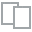
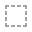
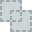
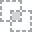
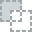
...
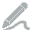
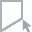
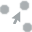
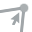
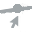

In [9]:
#create report
report = create_report(df1, title='My Report')
report

In [10]:
# Import the processed data from notebook One

df = h2o.import_file('https://raw.githubusercontent.com/abidi-b/WHO-Life-Expectancy-Prediction/main/WHOLifeExpectancyData.csv')

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [11]:
df.head()

Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
Afghanistan,2015,Developing,65,263,62,0.01,71.2796,65,1154,19.1,83,6,8.16,65,0.1,584.259,3.37365e+07,17.2,17.3,0.479,10.1
Afghanistan,2014,Developing,59.9,271,64,0.01,73.5236,62,492,18.6,86,58,8.18,62,0.1,612.697,327582,17.5,17.5,0.476,10
Afghanistan,2013,Developing,59.9,268,66,0.01,73.2192,64,430,18.1,89,62,8.13,64,0.1,631.745,3.17317e+07,17.7,17.7,0.47,9.9
Afghanistan,2012,Developing,59.5,272,69,0.01,78.1842,67,2787,17.6,93,67,8.52,67,0.1,669.959,3.69696e+06,17.9,18,0.463,9.8
Afghanistan,2011,Developing,59.2,275,71,0.01,7.09711,68,3013,17.2,97,68,7.87,68,0.1,63.5372,2.9786e+06,18.2,18.2,0.454,9.5
Afghanistan,2010,Developing,58.8,279,74,0.01,79.6794,66,1989,16.7,102,66,9.2,66,0.1,553.329,2.88317e+06,18.4,18.4,0.448,9.2
Afghanistan,2009,Developing,58.6,281,77,0.01,56.7622,63,2861,16.2,106,63,9.42,63,0.1,445.893,284331,18.6,18.7,0.434,8.9
Afghanistan,2008,Developing,58.1,287,80,0.03,25.8739,64,1599,15.7,110,64,8.33,64,0.1,373.361,2.72943e+06,18.8,18.9,0.433,8.7
Afghanistan,2007,Developing,57.5,295,82,0.02,10.9102,63,1141,15.2,113,63,6.73,63,0.1,369.836,2.66168e+07,19,19.1,0.415,8.4
Afghanistan,2006,Developing,57.3,295,84,0.03,17.1715,64,1990,14.7,116,58,7.43,58,0.1,272.564,2.58934e+06,19.2,19.3,0.405,8.1


In [12]:
df.types

{'Adult Mortality': 'int',
 'Alcohol': 'real',
 'BMI ': 'real',
 'Country': 'enum',
 'Diphtheria ': 'int',
 'GDP': 'real',
 'HIV/AIDS': 'real',
 'Hepatitis B': 'int',
 'Income composition of resources': 'real',
 'Life expectancy ': 'real',
 'Measles ': 'int',
 'Polio': 'int',
 'Population': 'real',
 'Schooling': 'real',
 'Status': 'enum',
 'Total expenditure': 'real',
 'Year': 'int',
 'infant deaths': 'int',
 'percentage expenditure': 'real',
 'thinness  1-19 years': 'real',
 'thinness 5-9 years': 'real',
 'under-five deaths ': 'int'}

In [13]:
 df['churn_bit']=df['Status'].asnumeric()

In [14]:
df.describe()

Rows:2938
Cols:23




,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling,churn_bit
type,enum,int,enum,real,int,int,real,real,int,int,real,int,int,real,int,real,real,real,real,real,real,real,int
mins,,2000.0,,36.3,1.0,0.0,0.01,0.0,1.0,0.0,1.0,0.0,3.0,0.37,2.0,0.1,1.68135,34.0,0.1,0.1,0.0,0.0,0.0
mean,,2007.5187202178356,,69.22493169398908,164.79644808743168,30.303948264125246,4.602860787172011,738.2512954533831,80.94046121593293,2419.592239618789,38.32124655647383,42.0357385976855,82.55018842069202,5.938189528023599,82.3240835902706,1.7421034717494894,7483.158469138471,12753375.120052496,4.839703856749312,4.870316804407714,0.6275510645976182,11.992792792792793,0.8257317903335603
maxs,,2015.0,,89.0,723.0,1800.0,17.87,19479.91161,99.0,212183.0,87.3,2500.0,99.0,17.6,99.0,50.6,119172.7418,1293859294.0,27.7,28.6,0.948,20.7,1.0
sigma,,4.613840940258098,,9.5238674878243,124.29207900342186,117.92650131339909,4.052412658755661,1987.9148580161914,25.0700155930181,11467.27248923462,20.044033502562083,160.44554840573366,23.4280459494685,2.498319672155632,23.716912068572594,5.077784531086549,14270.169341515977,61012096.50842794,4.42019494714432,4.508882086983003,0.21090355515159295,3.3589197211023567,0.3794045280851151
zeros,,0,,0,0,848,0,611,0,983,0,785,0,0,0,0,0,0,0,0,130,28,512
missing,0,0,0,10,10,0,194,0,553,0,34,0,19,226,19,0,448,652,34,34,167,163,0
0,Afghanistan,2015.0,Developing,65.0,263.0,62.0,0.01,71.27962362,65.0,1154.0,19.1,83.0,6.0,8.16,65.0,0.1,584.25921,33736494.0,17.2,17.3,0.479,10.1,1.0
1,Afghanistan,2014.0,Developing,59.9,271.0,64.0,0.01,73.52358168,62.0,492.0,18.6,86.0,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0,1.0
2,Afghanistan,2013.0,Developing,59.9,268.0,66.0,0.01,73.21924272,64.0,430.0,18.1,89.0,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.47,9.9,1.0


In [15]:
df.types

{'Adult Mortality': 'int',
 'Alcohol': 'real',
 'BMI ': 'real',
 'Country': 'enum',
 'Diphtheria ': 'int',
 'GDP': 'real',
 'HIV/AIDS': 'real',
 'Hepatitis B': 'int',
 'Income composition of resources': 'real',
 'Life expectancy ': 'real',
 'Measles ': 'int',
 'Polio': 'int',
 'Population': 'real',
 'Schooling': 'real',
 'Status': 'enum',
 'Total expenditure': 'real',
 'Year': 'int',
 'churn_bit': 'real',
 'infant deaths': 'int',
 'percentage expenditure': 'real',
 'thinness  1-19 years': 'real',
 'thinness 5-9 years': 'real',
 'under-five deaths ': 'int'}

In [16]:
#creating 80:20 train:test split
churn_train,churn_test = df.split_frame([0.80])

In [17]:
print (churn_train.shape)
print (churn_test.shape)


(2348, 23)
(590, 23)


In [18]:
churn_train.head()

Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling,churn_bit
Afghanistan,2015,Developing,65,263,62,0.01,71.2796,65,1154,19.1,83,6,8.16,65,0.1,584.259,3.37365e+07,17.2,17.3,0.479,10.1,1
Afghanistan,2014,Developing,59.9,271,64,0.01,73.5236,62,492,18.6,86,58,8.18,62,0.1,612.697,327582,17.5,17.5,0.476,10,1
Afghanistan,2012,Developing,59.5,272,69,0.01,78.1842,67,2787,17.6,93,67,8.52,67,0.1,669.959,3.69696e+06,17.9,18,0.463,9.8,1
Afghanistan,2011,Developing,59.2,275,71,0.01,7.09711,68,3013,17.2,97,68,7.87,68,0.1,63.5372,2.9786e+06,18.2,18.2,0.454,9.5,1
Afghanistan,2009,Developing,58.6,281,77,0.01,56.7622,63,2861,16.2,106,63,9.42,63,0.1,445.893,284331,18.6,18.7,0.434,8.9,1
Afghanistan,2008,Developing,58.1,287,80,0.03,25.8739,64,1599,15.7,110,64,8.33,64,0.1,373.361,2.72943e+06,18.8,18.9,0.433,8.7,1
Afghanistan,2007,Developing,57.5,295,82,0.02,10.9102,63,1141,15.2,113,63,6.73,63,0.1,369.836,2.66168e+07,19,19.1,0.415,8.4,1
Afghanistan,2006,Developing,57.3,295,84,0.03,17.1715,64,1990,14.7,116,58,7.43,58,0.1,272.564,2.58934e+06,19.2,19.3,0.405,8.1,1
Afghanistan,2005,Developing,57.3,291,85,0.02,1.38865,66,1296,14.2,118,58,8.7,58,0.1,25.2941,257798,19.3,19.5,0.396,7.9,1
Afghanistan,2004,Developing,57,293,87,0.02,15.2961,67,466,13.8,120,5,8.79,5,0.1,219.141,2.4119e+07,19.5,19.7,0.381,6.8,1


In [19]:
y='Life expectancy '
y_num='churn_bit'
x=df.columns


In [20]:
x.remove(y)
x.remove(y_num)

In [21]:
# regression


#seed=121 to ensure reproducibility.
aml= H2OAutoML (max_models=10, seed=121, verbosity="info", nfolds=0)

In [22]:
#Classifying churn
mod1=aml.train (x=x, y=y, training_frame=churn_train)

AutoML progress: |
02:23:59.670: Project: AutoML_1_20220214_22359
02:23:59.672: Cross-validation disabled by user: no fold column nor nfolds > 1.
02:23:59.679: Setting stopping tolerance adaptively based on the training frame: 0.0206372085853249
02:23:59.679: Build control seed: 121
02:23:59.690: Since cross-validation is disabled, and validation frame(s) were not provided, automatically split the training data into training, validation frame(s) in the ratio 90/10/0.
02:23:59.807: training frame: Frame key: AutoML_1_20220214_22359_training_py_4_sid_98fe    cols: 23    rows: 2123  chunks: 8    size: 234783  checksum: 2306444915020788255
02:23:59.813: validation frame: Frame key: AutoML_1_20220214_22359_validation_py_4_sid_98fe    cols: 23    rows: 225  chunks: 8    size: 62938  checksum: -7530408236156170592
02:23:59.813: leaderboard frame: Frame key: AutoML_1_20220214_22359_validation_py_4_sid_98fe    cols: 23    rows: 225  chunks: 8    size: 62938  checksum: -7530408236156170592
02:23

In [23]:
print (mod1)

Model Details
H2OGradientBoostingEstimator :  Gradient Boosting Machine
Model Key:  GBM_2_AutoML_1_20220214_22359


Model Summary: 


,,number_of_trees,number_of_internal_trees,model_size_in_bytes,min_depth,max_depth,mean_depth,min_leaves,max_leaves,mean_leaves
0,,70.0,70.0,78844.0,7.0,7.0,7.0,25.0,86.0,53.714287




ModelMetricsRegression: gbm
** Reported on train data. **

MSE: 0.585655117489501
RMSE: 0.7652810709076118
MAE: 0.4330459111807872
RMSLE: 0.011495010317547412
Mean Residual Deviance: 0.585655117489501

ModelMetricsRegression: gbm
** Reported on validation data. **

MSE: 1.9478095593255098
RMSE: 1.3956394804266286
MAE: 0.8620765907637868
RMSLE: 0.02107903832438451
Mean Residual Deviance: 1.9478095593255098

Scoring History: 


,,timestamp,duration,number_of_trees,training_rmse,training_mae,training_deviance,validation_rmse,validation_mae,validation_deviance
0,,2022-02-14 02:24:13,0.003 sec,0.0,9.623823,7.894714,92.617963,9.599366,7.875702,92.147829
1,,2022-02-14 02:24:13,0.114 sec,5.0,5.884559,4.787245,34.628038,5.872353,4.762013,34.484528
2,,2022-02-14 02:24:13,0.233 sec,10.0,3.713976,2.965938,13.793619,3.770878,2.992895,14.219520
3,,2022-02-14 02:24:13,0.343 sec,15.0,2.463367,1.902880,6.068179,2.571726,1.960595,6.613776
4,,2022-02-14 02:24:13,0.460 sec,20.0,1.726297,1.255393,2.980100,1.914800,1.405702,3.666458
5,,2022-02-14 02:24:13,0.550 sec,25.0,1.374142,0.927192,1.888265,1.635470,1.140562,2.674762
6,,2022-02-14 02:24:13,0.693 sec,30.0,1.171978,0.734461,1.373533,1.497025,0.995140,2.241084
7,,2022-02-14 02:24:14,0.869 sec,35.0,1.055149,0.623533,1.113340,1.439468,0.919291,2.072069
8,,2022-02-14 02:24:14,0.961 sec,40.0,0.979487,0.560901,0.959394,1.412670,0.885485,1.995635
9,,2022-02-14 02:24:14,1.076 sec,45.0,0.933086,0.529618,0.870650,1.407977,0.878062,1.982398



Variable Importances: 


,variable,relative_importance,scaled_importance,percentage
0,Country,363693.312500,1.000000,0.382270
1,HIV/AIDS,253046.343750,0.695768,0.265972
2,Income composition of resources,158125.781250,0.434778,0.166203
3,Adult Mortality,123259.359375,0.338910,0.129555
4,Schooling,13269.632812,0.036486,0.013947
5,Year,9946.173828,0.027348,0.010454
6,thinness 5-9 years,7492.530762,0.020601,0.007875
7,BMI,4658.221680,0.012808,0.004896
8,thinness 1-19 years,2634.420410,0.007244,0.002769
9,Hepatitis B,2422.836182,0.006662,0.002547



See the whole table with table.as_data_frame()



In [24]:
myleaderboard= aml.leaderboard

In [25]:
myleaderboard.head(rows=myleaderboard.nrows)

model_id,mean_residual_deviance,rmse,mse,mae,rmsle
GBM_2_AutoML_1_20220214_22359,1.94781,1.39564,1.94781,0.862077,0.021079
GBM_5_AutoML_1_20220214_22359,1.95861,1.3995,1.95861,0.839607,0.0211202
GBM_4_AutoML_1_20220214_22359,2.13784,1.46213,2.13784,0.915097,0.0218464
GBM_3_AutoML_1_20220214_22359,2.17972,1.47639,2.17972,0.879185,0.0223298
DRF_1_AutoML_1_20220214_22359,2.48476,1.57631,2.48476,0.995099,0.0243759
GBM_1_AutoML_1_20220214_22359,2.55638,1.59887,2.55638,0.986506,0.0250349
XRT_1_AutoML_1_20220214_22359,2.73071,1.65248,2.73071,1.08802,0.0252289
GBM_grid_1_AutoML_1_20220214_22359_model_1,3.15326,1.77574,3.15326,1.1749,0.0281542
DeepLearning_1_AutoML_1_20220214_22359,7.63736,2.76358,7.63736,2.0523,0.0420445
GLM_1_AutoML_1_20220214_22359,91.1624,9.5479,91.1624,7.83,0.146411


# Leaderboard

> Leaderboard shows models with their metrics. When provided with H2OAutoML object, the leaderboard shows 5-fold cross-validated metrics by default (depending on the H2OAutoML settings), otherwise it shows metrics computed on the frame. At most 20 models are shown by default.

model_id,mean_residual_deviance,rmse,mse,mae,rmsle,training_time_ms,predict_time_per_row_ms,algo
GBM_2_AutoML_1_20220214_22359,1.94781,1.39564,1.94781,0.862077,0.021079,1579,0.053977,GBM
GBM_5_AutoML_1_20220214_22359,1.95861,1.3995,1.95861,0.839607,0.0211202,1337,0.066622,GBM
GBM_4_AutoML_1_20220214_22359,2.13784,1.46213,2.13784,0.915097,0.0218464,1658,0.062243,GBM
GBM_3_AutoML_1_20220214_22359,2.17972,1.47639,2.17972,0.879185,0.0223298,1295,0.055208,GBM
DRF_1_AutoML_1_20220214_22359,2.48476,1.57631,2.48476,0.995099,0.0243759,5347,0.055311,DRF
GBM_1_AutoML_1_20220214_22359,2.55638,1.59887,2.55638,0.986506,0.0250349,3562,0.067829,GBM
XRT_1_AutoML_1_20220214_22359,2.73071,1.65248,2.73071,1.08802,0.0252289,5901,0.080679,DRF
GBM_grid_1_AutoML_1_20220214_22359_model_1,3.15326,1.77574,3.15326,1.1749,0.0281542,980,0.07038,GBM
DeepLearning_1_AutoML_1_20220214_22359,7.63736,2.76358,7.63736,2.0523,0.0420445,1267,0.015339,DeepLearning
GLM_1_AutoML_1_20220214_22359,91.1624,9.5479,91.1624,7.83,0.146411,710,0.026775,GLM


# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

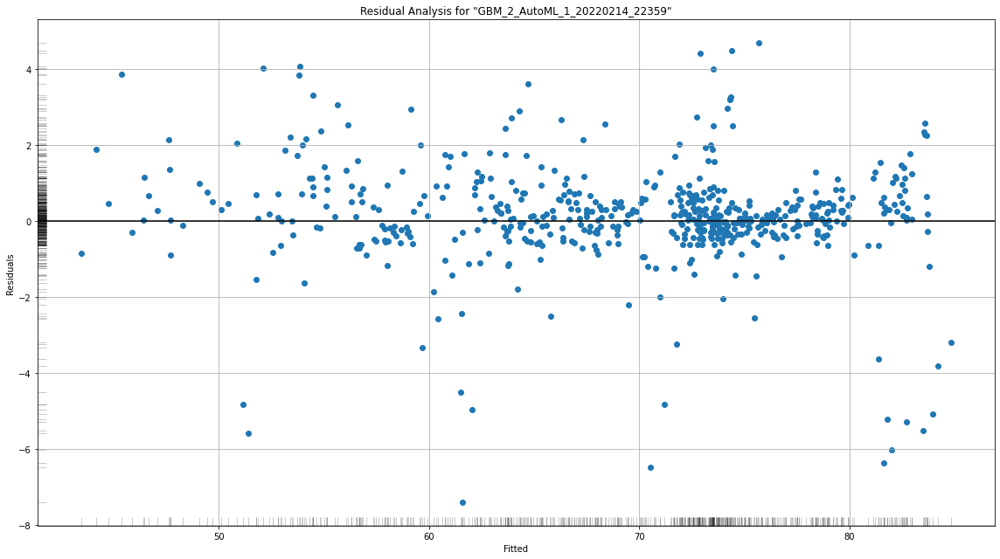

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

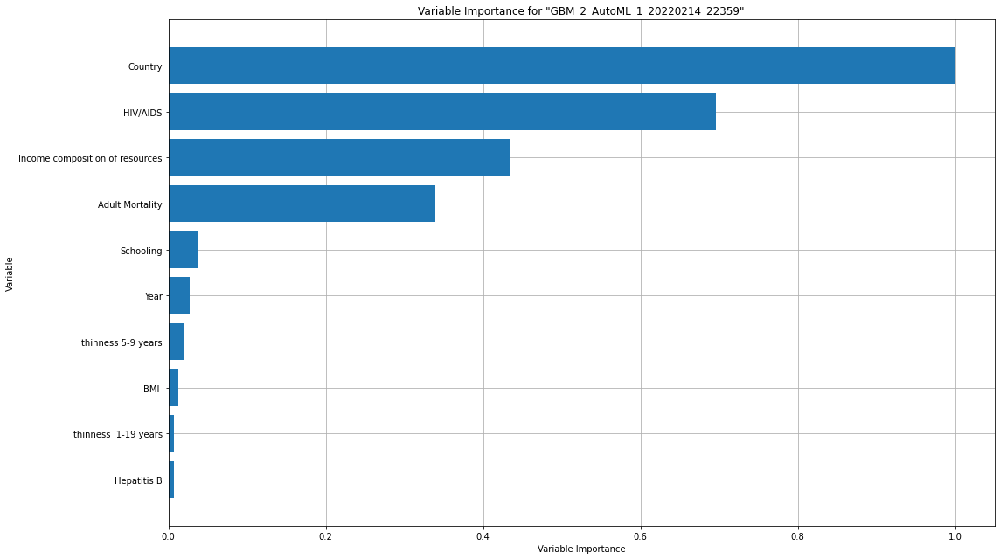

# Variable Importance Heatmap

> Variable importance heatmap shows variable importance across multiple models. Some models in H2O return variable importance for one-hot (binary indicator) encoded versions of categorical columns (e.g. Deep Learning, XGBoost). In order for the variable importance of categorical columns to be compared across all model types we compute a summarization of the the variable importance across all one-hot encoded features and return a single variable importance for the original categorical feature. By default, the models and variables are ordered by their similarity.

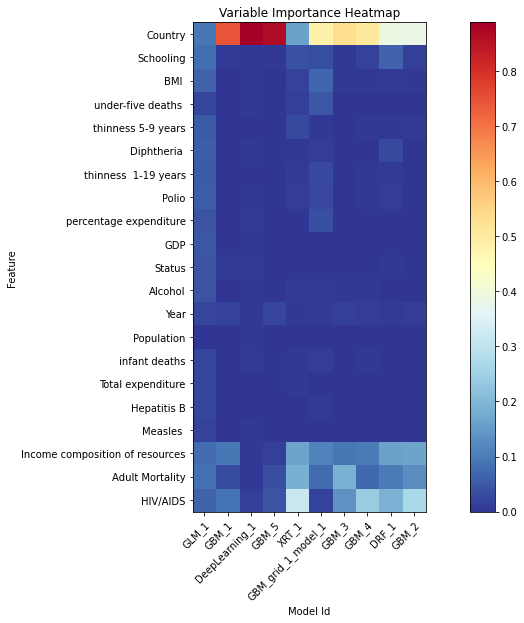

# Model Correlation

> This plot shows the correlation between the predictions of the models. For classification, frequency of identical predictions is used. By default, models are ordered by their similarity (as computed by hierarchical clustering). Interpretable models, such as GAM, GLM, and RuleFit are highlighted using red colored text.

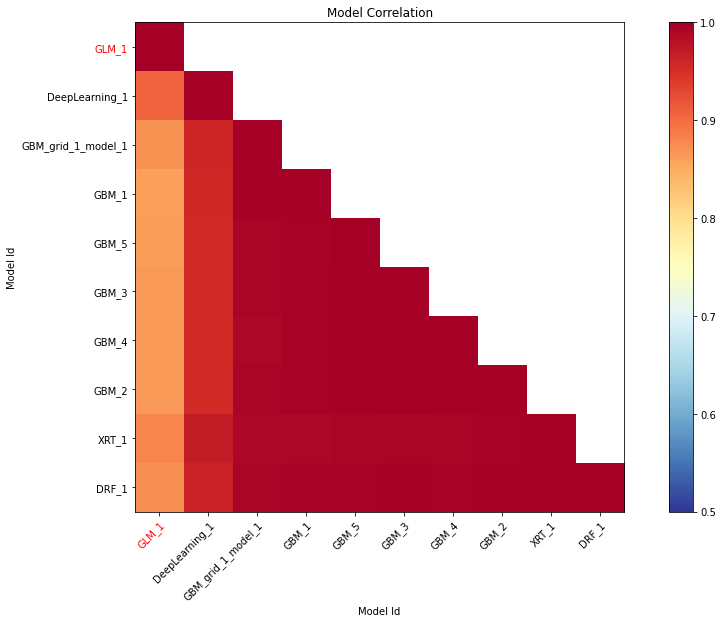

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

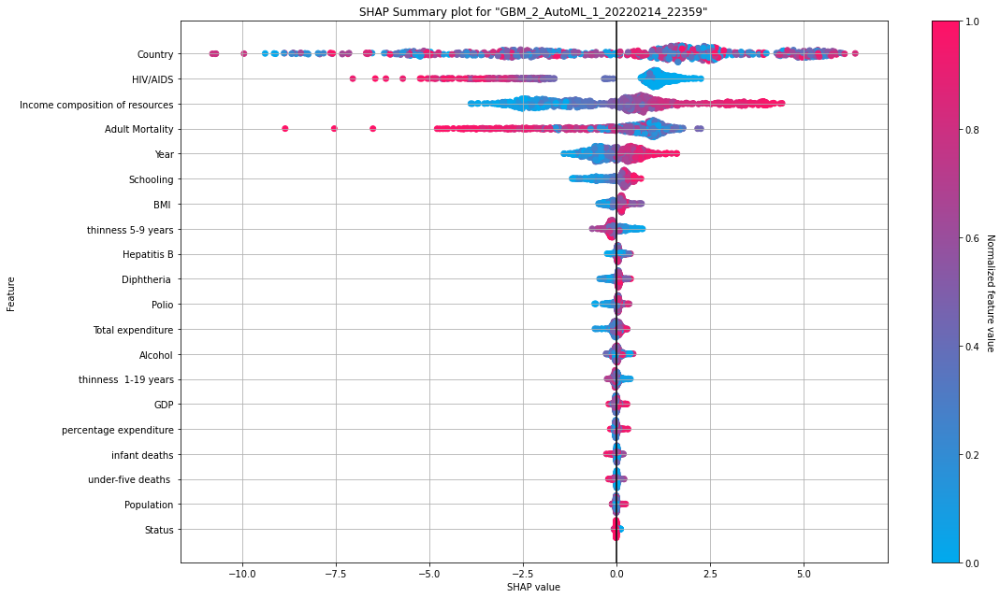

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

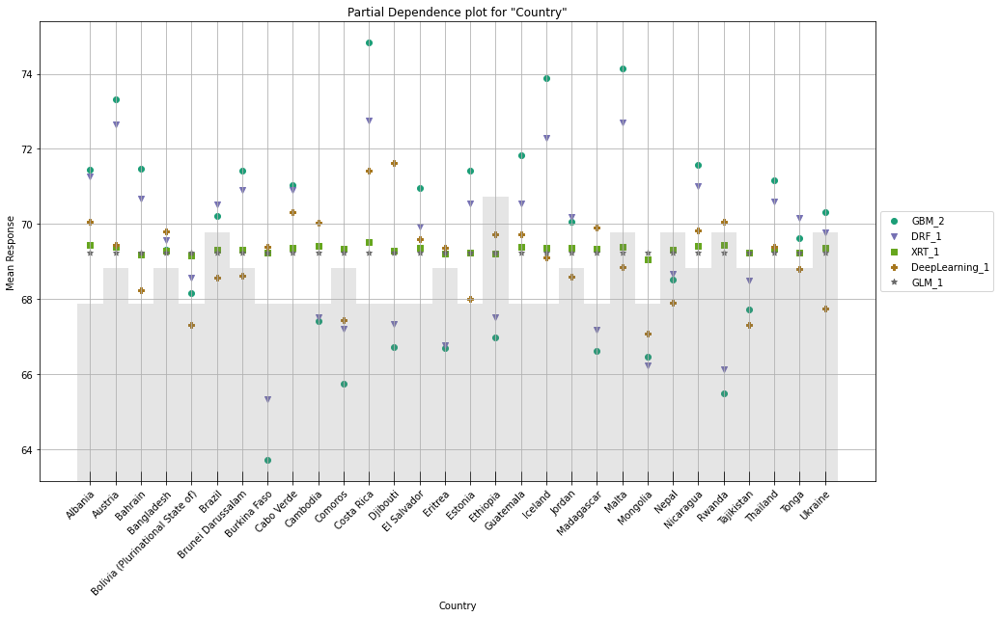

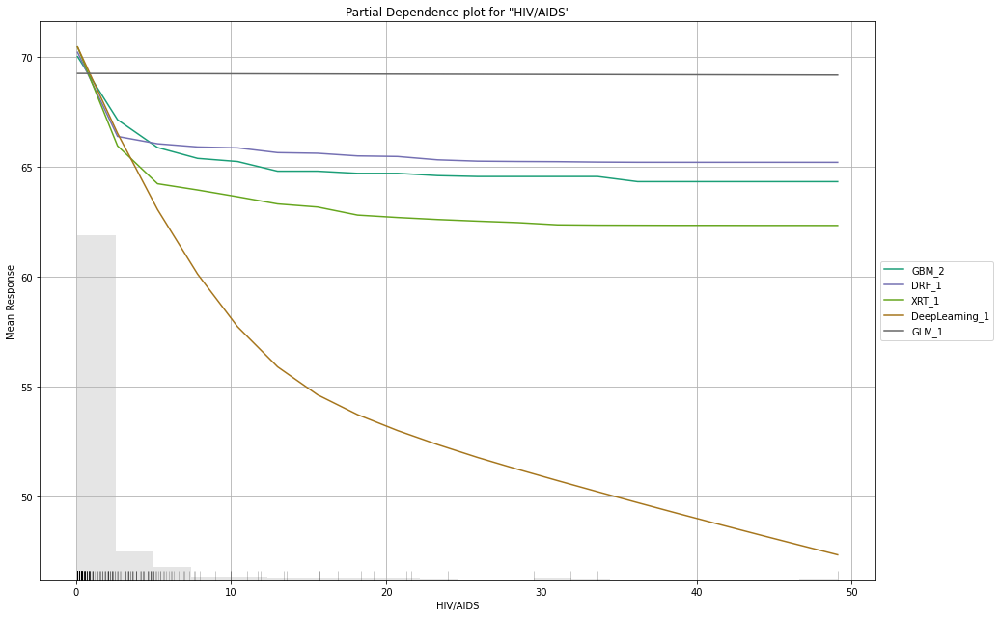

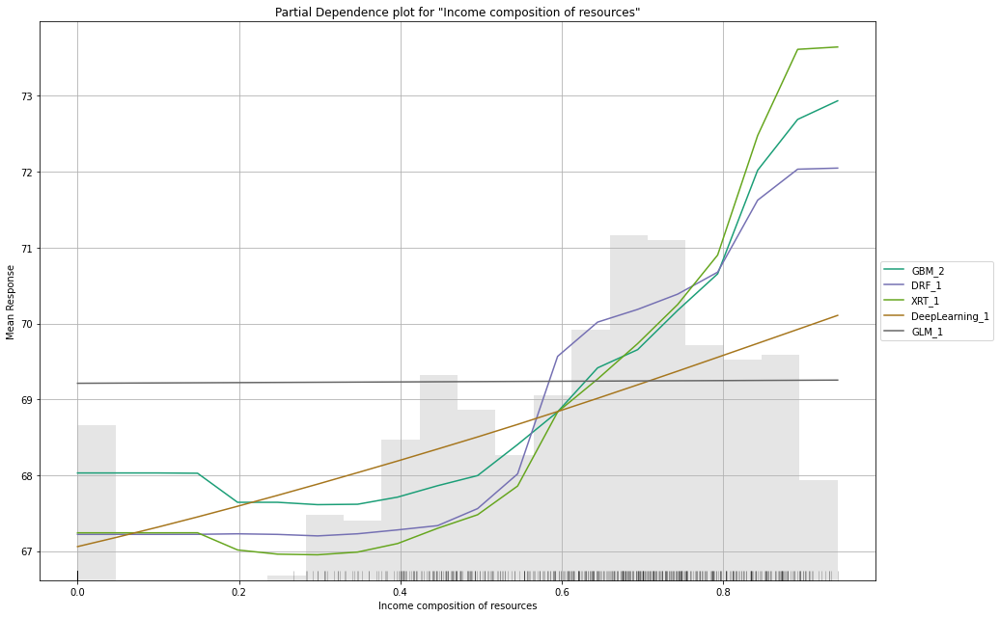

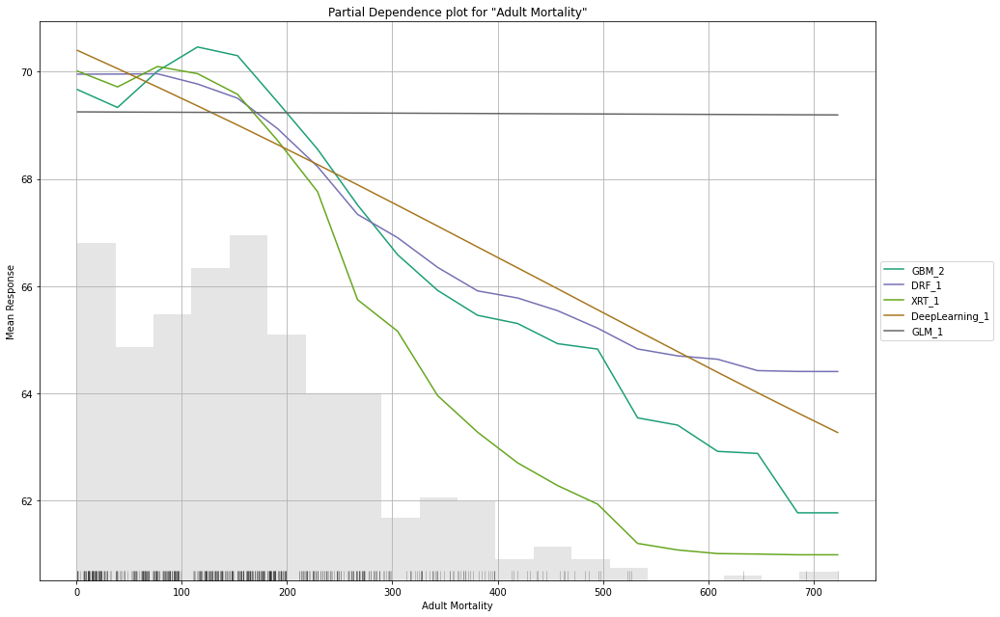

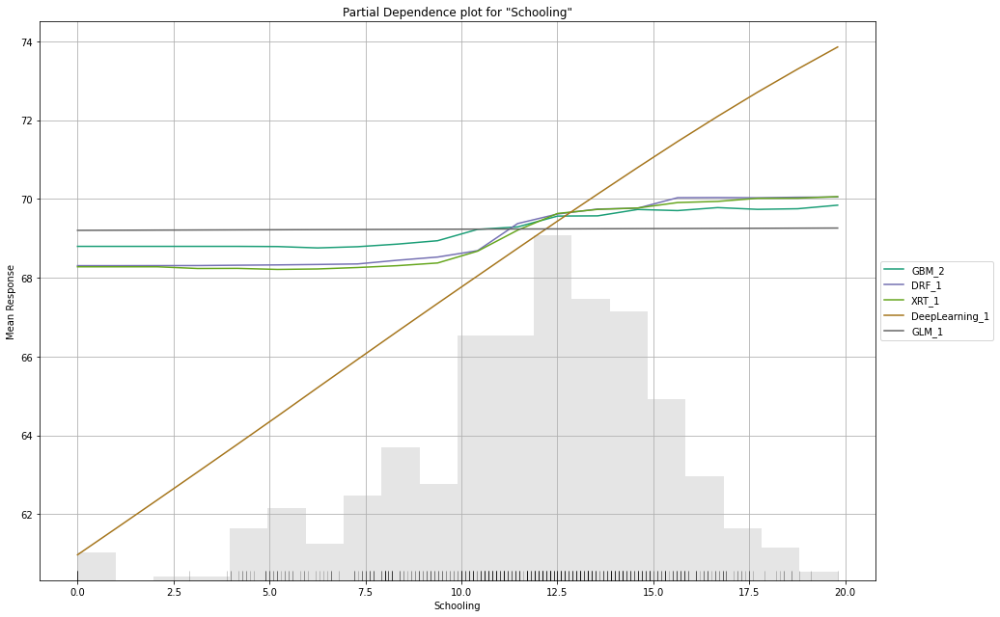

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

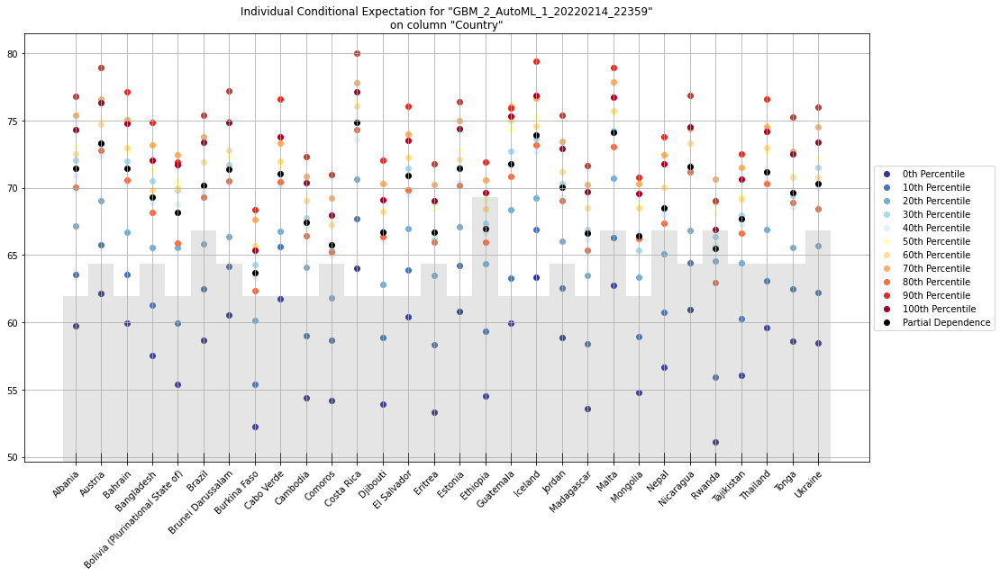

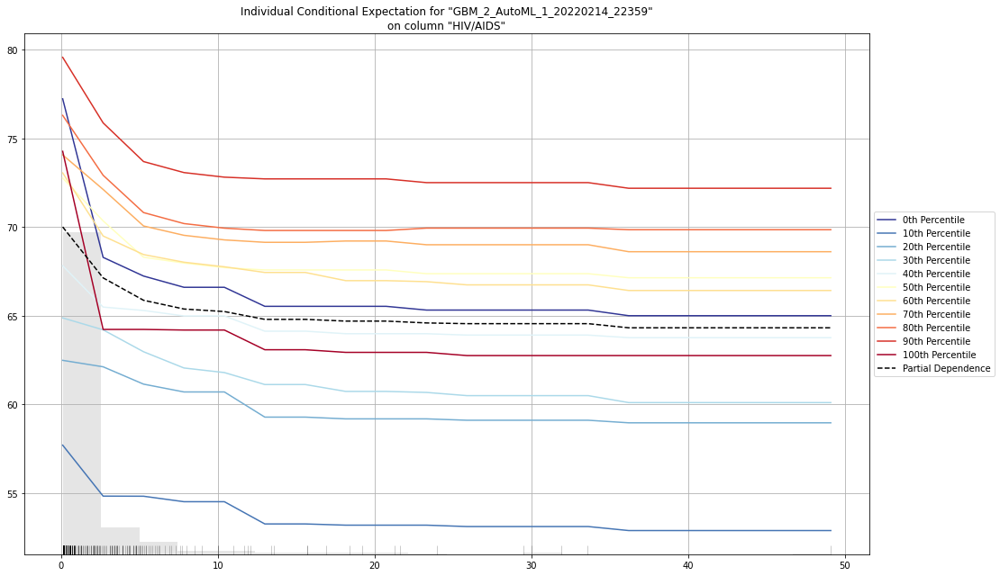

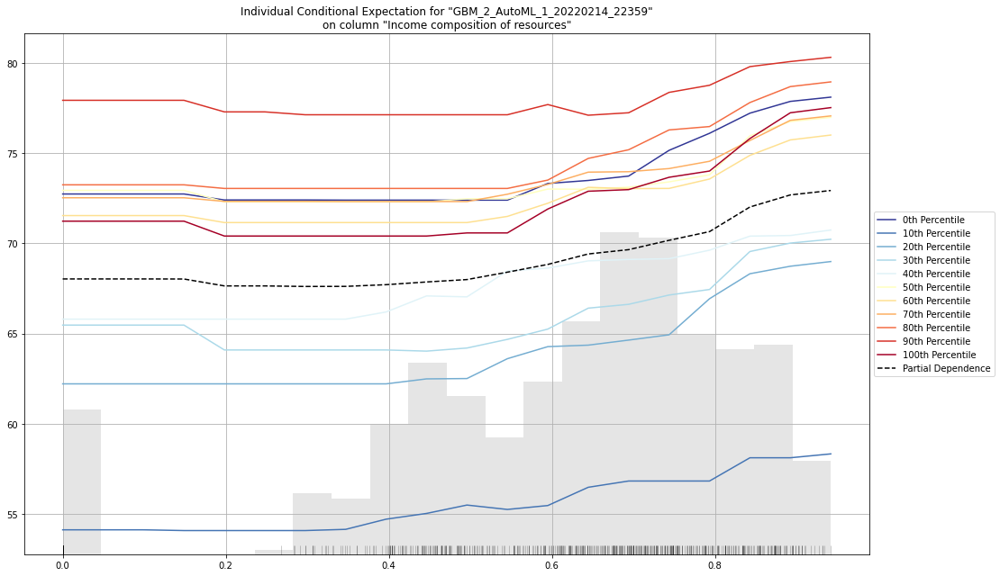

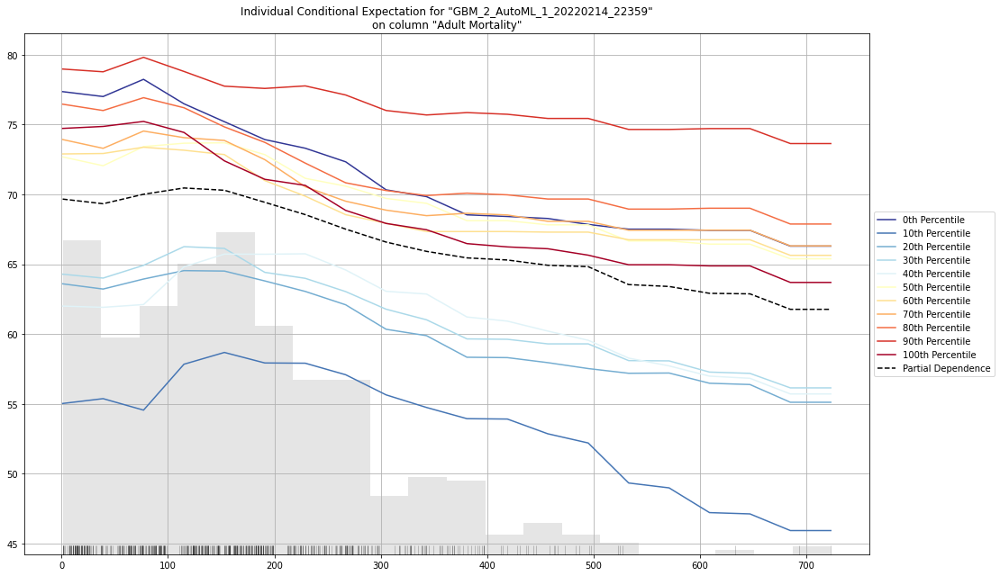

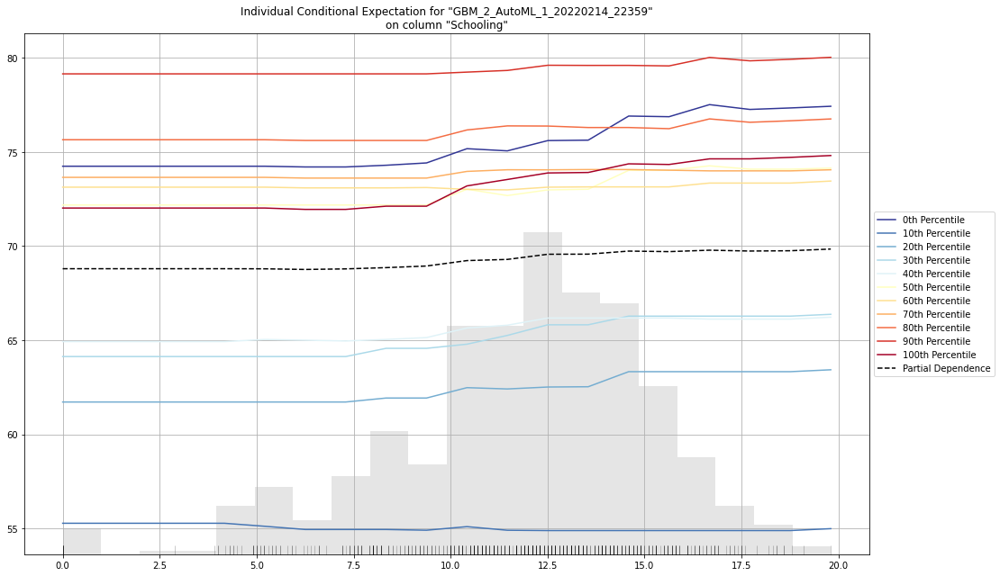

In [26]:
exm=aml.explain(churn_test)

# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

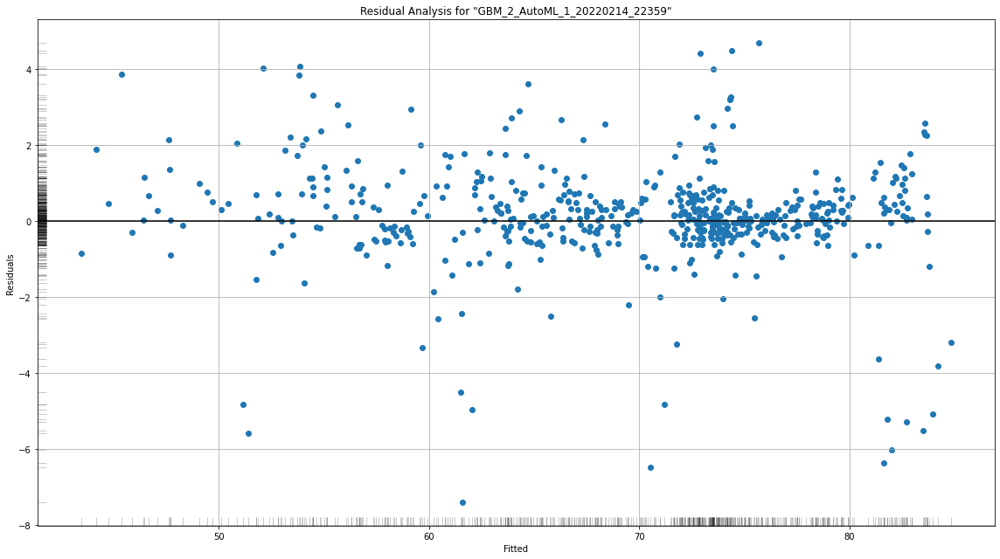

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

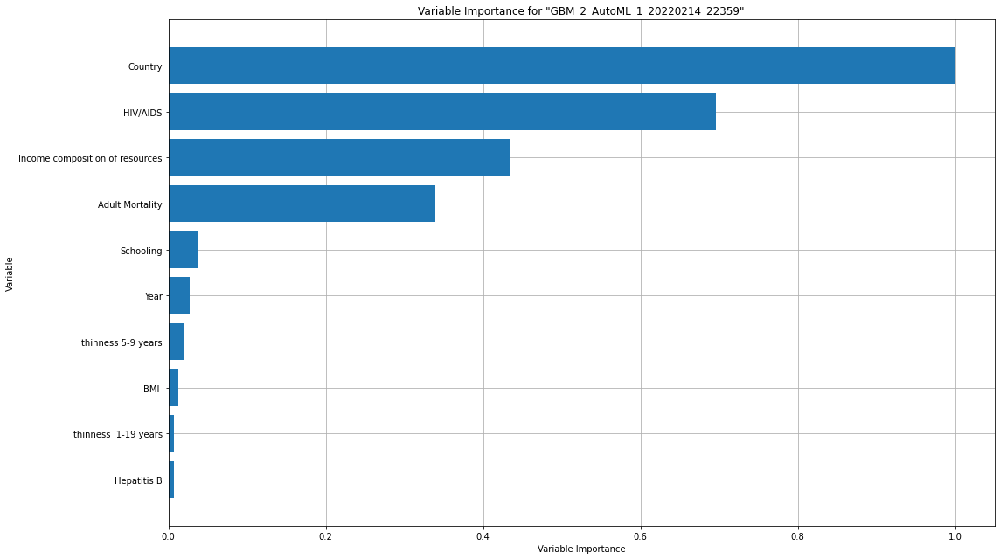

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

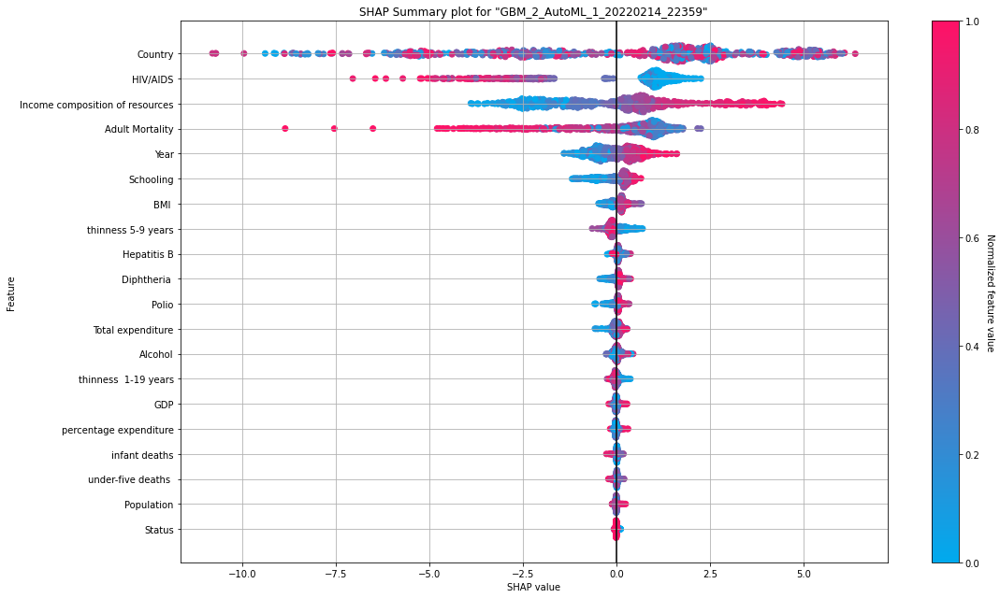

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

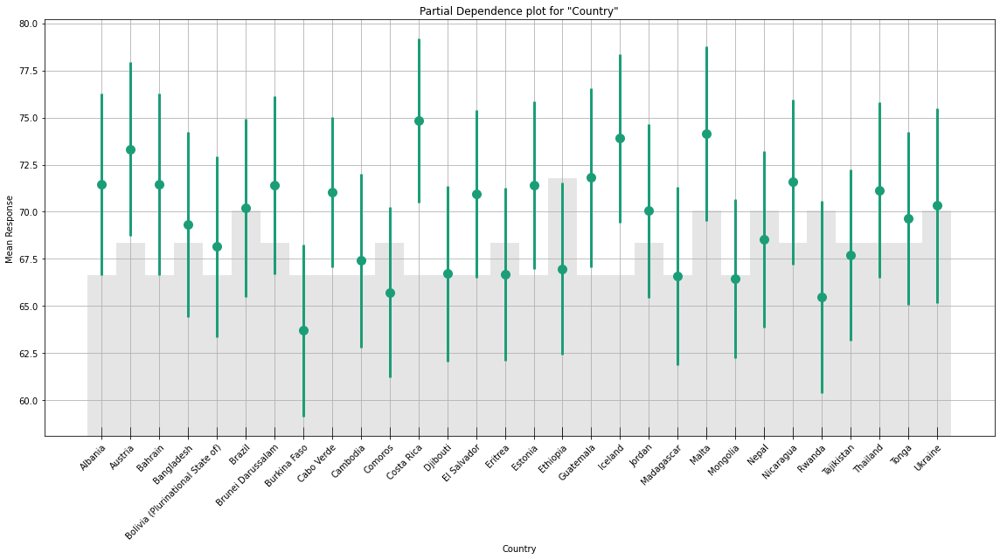

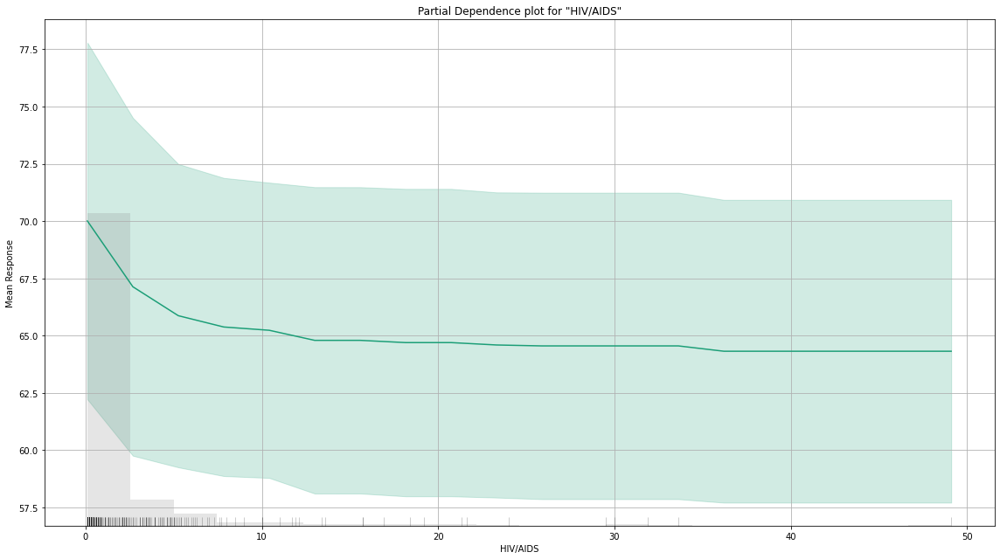

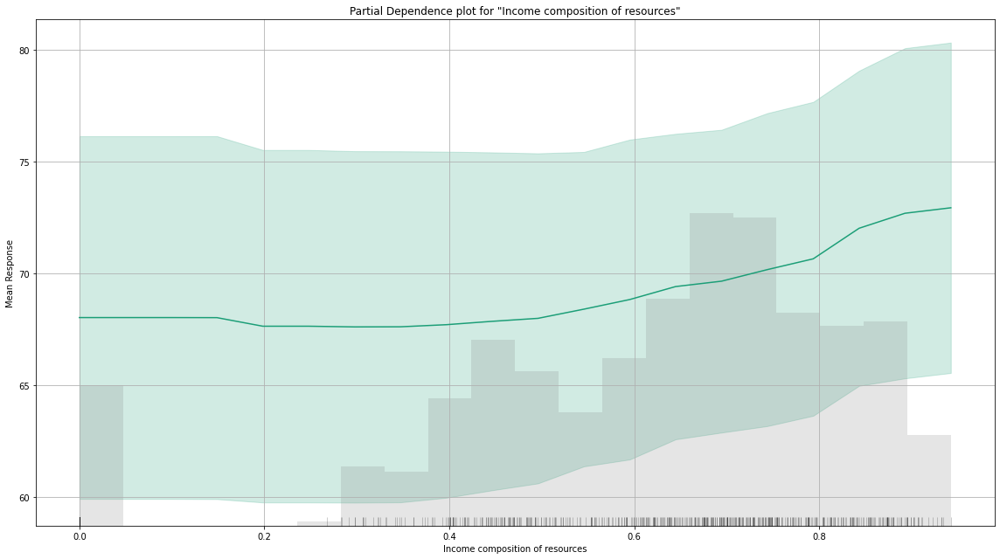

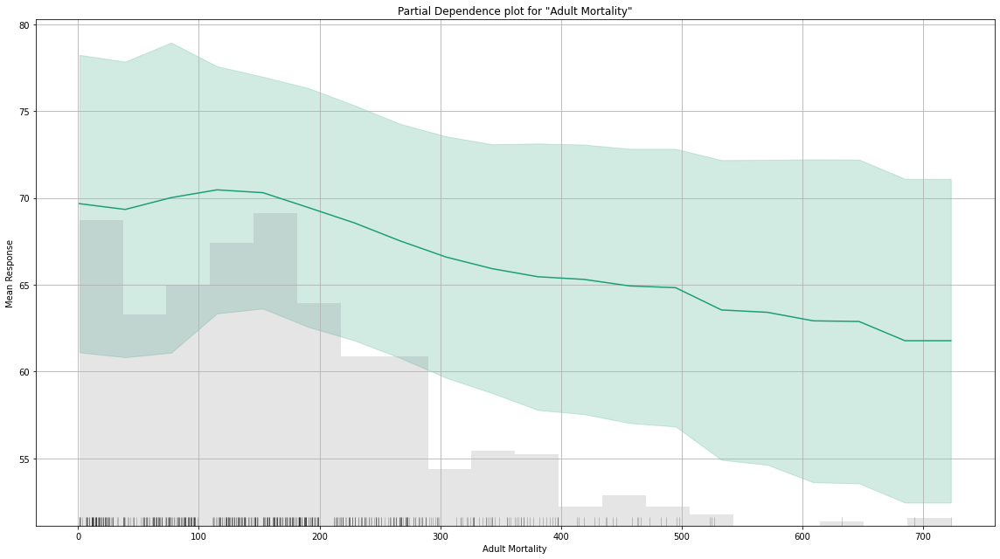

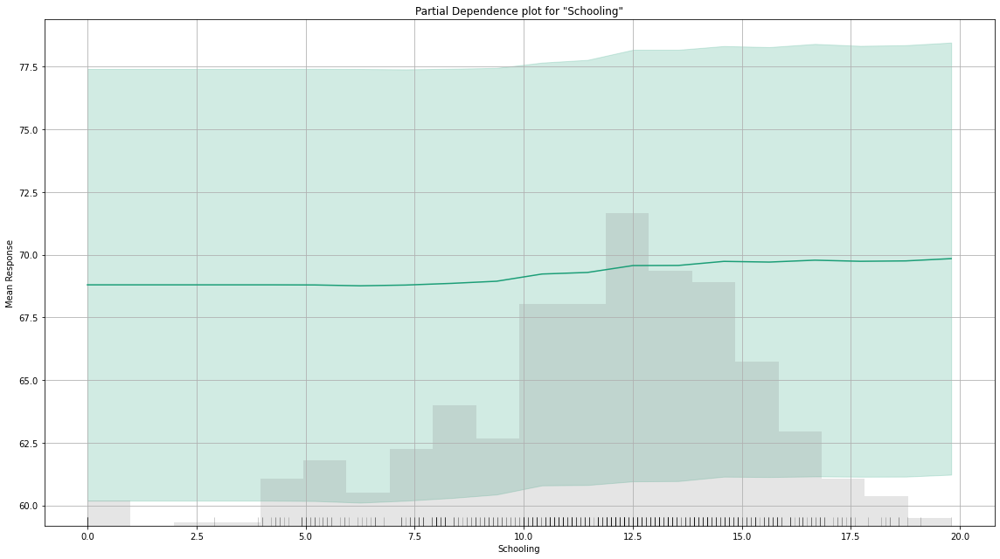

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

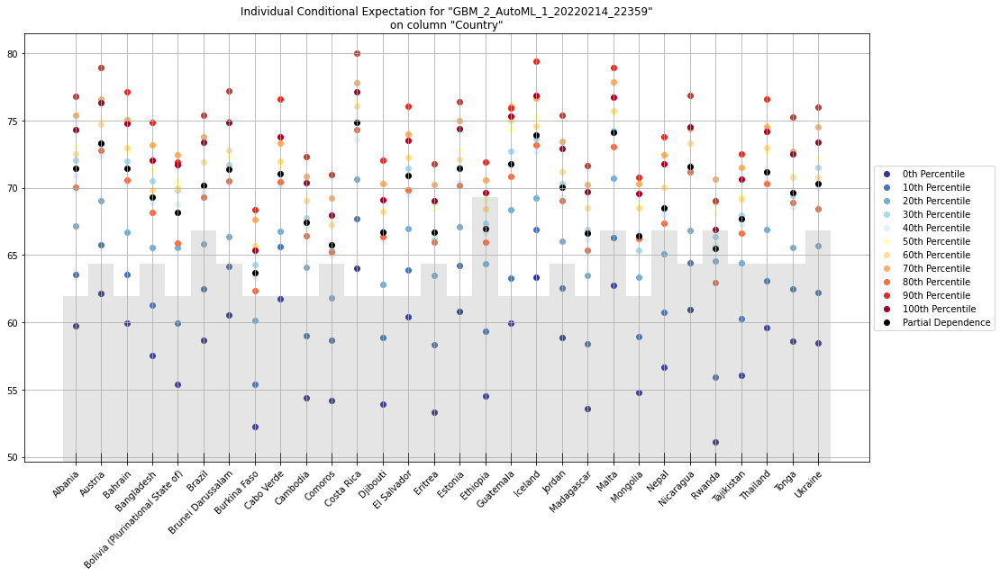

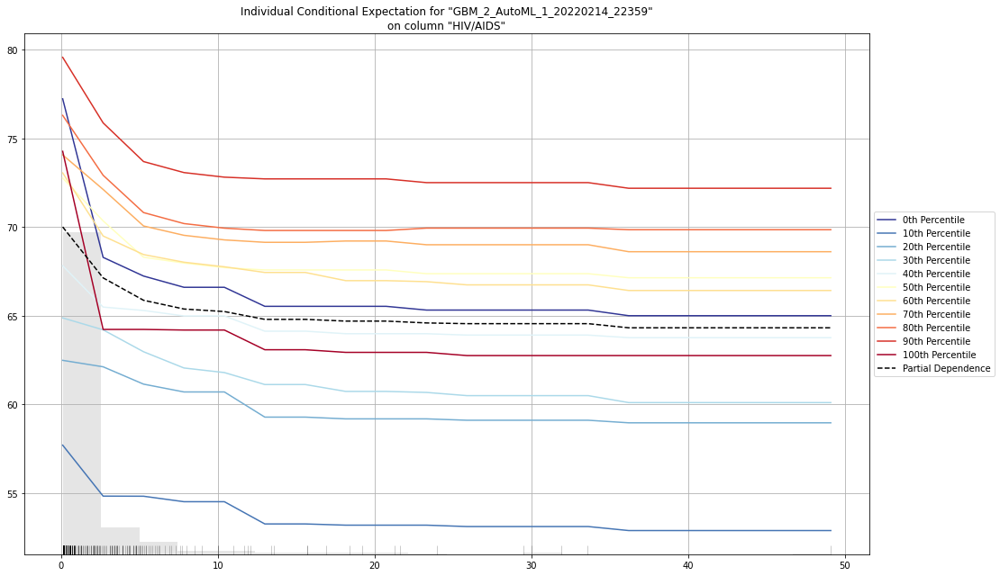

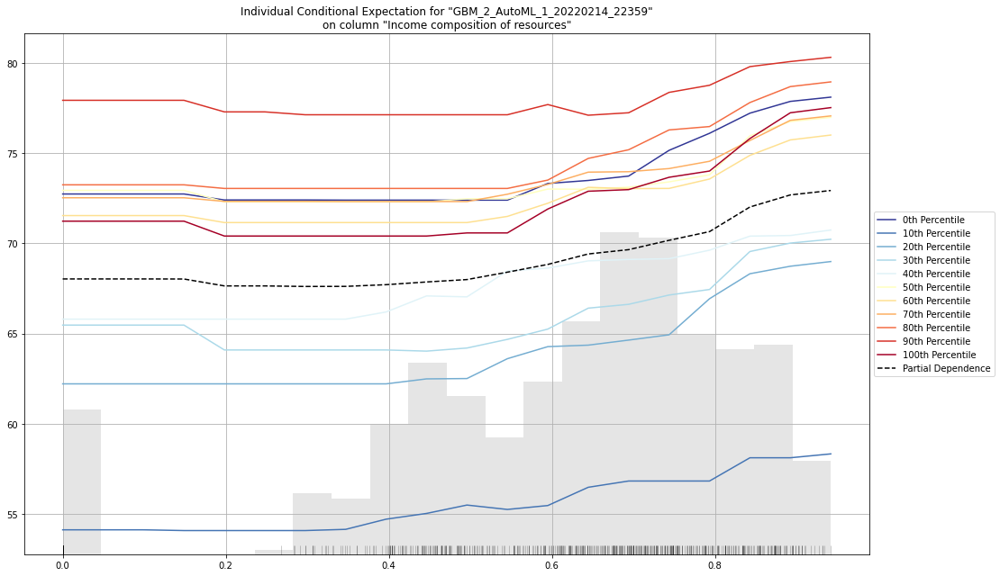

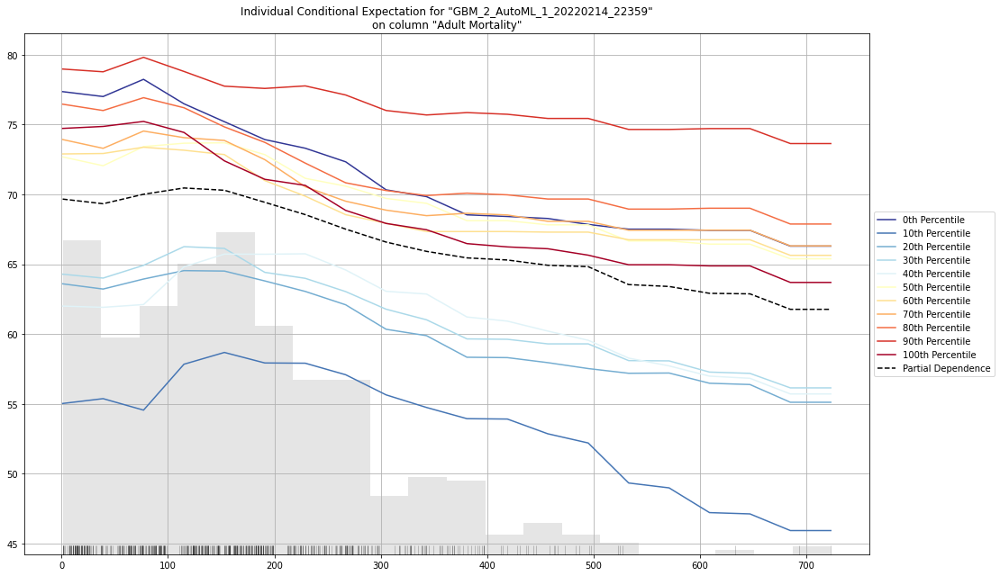

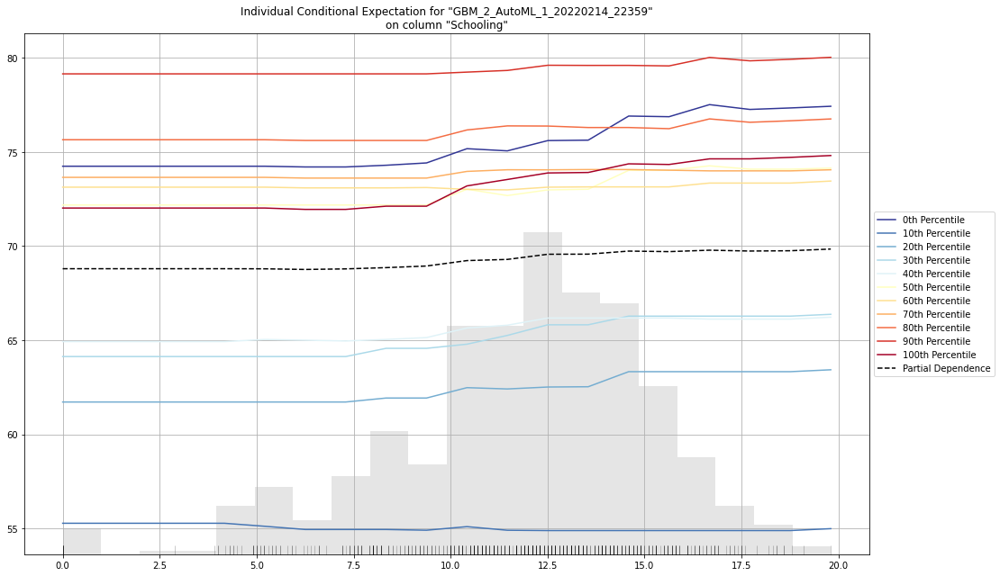

In [27]:
show_2=aml.leader.explain(churn_test)

In [28]:
#make prediction
preds = aml.leader.predict(churn_test)

#combine the prediction with the test dataset
df = churn_test.cbind(preds)

gbm prediction progress: |███████████████████████████████████████████████████████| (done) 100%


In [29]:
df

Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling,churn_bit,predict
Afghanistan,2013,Developing,59.9,268,66,0.01,73.2192,64,430,18.1,89,62,8.13,64,0.1,631.745,3.17317e+07,17.7,17.7,0.47,9.9,1,60.8298
Afghanistan,2010,Developing,58.8,279,74,0.01,79.6794,66,1989,16.7,102,66,9.2,66,0.1,553.329,2.88317e+06,18.4,18.4,0.448,9.2,1,58.4203
Afghanistan,2002,Developing,56.2,3,88,0.01,16.8874,64,2486,13,122,36,7.76,36,0.1,187.846,2.19799e+07,19.9,2.2,0.341,6.2,1,59.1332
Albania,2008,Developing,75.3,1,1,5.61,36.6221,99,0,52.6,1,99,5.87,99,0.1,437.54,2.94731e+06,1.6,1.6,0.713,12,1,75.1599
Albania,2003,Developing,72.8,18,1,4.29,14.7193,97,8,47.9,1,97,6.27,97,0.1,189.682,339616,1.9,2,0.674,10.7,1,73.4943
Albania,2002,Developing,73.3,15,1,3.73,104.517,96,16,46.9,1,98,6.3,98,0.1,1453.64,3511,2,2.1,0.67,10.7,1,73.3664
Albania,2001,Developing,73.6,14,1,4.25,96.2056,96,18,46,1,97,6,97,0.1,1326.97,36173,2.1,2.1,0.662,10.6,1,73.4587
Albania,2000,Developing,72.6,11,1,3.66,91.7115,96,662,45,1,97,6.26,97,0.1,1175.79,38927,2.1,2.2,0.656,10.7,1,73.5026
Algeria,2010,Developing,74.7,119,21,0.45,430.718,95,103,53.9,24,95,5.12,95,0.1,4463.39,3.61176e+07,5.9,5.8,0.714,13.6,1,74.3234
Algeria,2009,Developing,74.4,123,20,0.5,352.064,94,107,52.8,23,94,5.36,95,0.1,3868.83,3.54658e+06,6,5.9,0.705,13.1,1,74.0647


In [30]:
model_ids= list (aml.leaderboard['model_id'].as_data_frame().iloc[:,0])




In [31]:
SE=h2o.get_model([mid for mid in model_ids if "GBM" in mid][0])
SE.params.keys()


dict_keys(['model_id', 'training_frame', 'validation_frame', 'nfolds', 'keep_cross_validation_models', 'keep_cross_validation_predictions', 'keep_cross_validation_fold_assignment', 'score_each_iteration', 'score_tree_interval', 'fold_assignment', 'fold_column', 'response_column', 'ignored_columns', 'ignore_const_cols', 'offset_column', 'weights_column', 'balance_classes', 'class_sampling_factors', 'max_after_balance_size', 'max_confusion_matrix_size', 'ntrees', 'max_depth', 'min_rows', 'nbins', 'nbins_top_level', 'nbins_cats', 'r2_stopping', 'stopping_rounds', 'stopping_metric', 'stopping_tolerance', 'max_runtime_secs', 'seed', 'build_tree_one_node', 'learn_rate', 'learn_rate_annealing', 'distribution', 'quantile_alpha', 'tweedie_power', 'huber_alpha', 'checkpoint', 'sample_rate', 'sample_rate_per_class', 'col_sample_rate', 'col_sample_rate_change_per_level', 'col_sample_rate_per_tree', 'min_split_improvement', 'histogram_type', 'max_abs_leafnode_pred', 'pred_noise_bandwidth', 'categor

In [32]:
mypredict=aml.leader.predict(churn_test)

gbm prediction progress: |███████████████████████████████████████████████████████| (done) 100%


In [33]:
mypredict.head()

predict
60.8298
58.4203
59.1332
75.1599
73.4943
73.3664
73.4587
73.5026
74.3234
74.0647


In [34]:
aml.leader.model_performance(churn_test)


ModelMetricsRegression: gbm
** Reported on test data. **

MSE: 1.8477689564476498
RMSE: 1.3593266555348829
MAE: 0.8173655451498985
RMSLE: 0.020234520020679922
Mean Residual Deviance: 1.8477689564476498


In [35]:
model_ids= list (aml.leaderboard['model_id'].as_data_frame().iloc[:,0])

In [36]:
model_ids

['GBM_2_AutoML_1_20220214_22359',
 'GBM_5_AutoML_1_20220214_22359',
 'GBM_4_AutoML_1_20220214_22359',
 'GBM_3_AutoML_1_20220214_22359',
 'DRF_1_AutoML_1_20220214_22359',
 'GBM_1_AutoML_1_20220214_22359',
 'XRT_1_AutoML_1_20220214_22359',
 'GBM_grid_1_AutoML_1_20220214_22359_model_1',
 'DeepLearning_1_AutoML_1_20220214_22359',
 'GLM_1_AutoML_1_20220214_22359']

In [37]:
# To examine best model 
m = aml.get_best_model()
print (m)

Model Details
H2OGradientBoostingEstimator :  Gradient Boosting Machine
Model Key:  GBM_2_AutoML_1_20220214_22359


Model Summary: 


,,number_of_trees,number_of_internal_trees,model_size_in_bytes,min_depth,max_depth,mean_depth,min_leaves,max_leaves,mean_leaves
0,,70.0,70.0,78844.0,7.0,7.0,7.0,25.0,86.0,53.714287




ModelMetricsRegression: gbm
** Reported on train data. **

MSE: 0.585655117489501
RMSE: 0.7652810709076118
MAE: 0.4330459111807872
RMSLE: 0.011495010317547412
Mean Residual Deviance: 0.585655117489501

ModelMetricsRegression: gbm
** Reported on validation data. **

MSE: 1.9478095593255098
RMSE: 1.3956394804266286
MAE: 0.8620765907637868
RMSLE: 0.02107903832438451
Mean Residual Deviance: 1.9478095593255098

Scoring History: 


,,timestamp,duration,number_of_trees,training_rmse,training_mae,training_deviance,validation_rmse,validation_mae,validation_deviance
0,,2022-02-14 02:24:13,0.003 sec,0.0,9.623823,7.894714,92.617963,9.599366,7.875702,92.147829
1,,2022-02-14 02:24:13,0.114 sec,5.0,5.884559,4.787245,34.628038,5.872353,4.762013,34.484528
2,,2022-02-14 02:24:13,0.233 sec,10.0,3.713976,2.965938,13.793619,3.770878,2.992895,14.219520
3,,2022-02-14 02:24:13,0.343 sec,15.0,2.463367,1.902880,6.068179,2.571726,1.960595,6.613776
4,,2022-02-14 02:24:13,0.460 sec,20.0,1.726297,1.255393,2.980100,1.914800,1.405702,3.666458
5,,2022-02-14 02:24:13,0.550 sec,25.0,1.374142,0.927192,1.888265,1.635470,1.140562,2.674762
6,,2022-02-14 02:24:13,0.693 sec,30.0,1.171978,0.734461,1.373533,1.497025,0.995140,2.241084
7,,2022-02-14 02:24:14,0.869 sec,35.0,1.055149,0.623533,1.113340,1.439468,0.919291,2.072069
8,,2022-02-14 02:24:14,0.961 sec,40.0,0.979487,0.560901,0.959394,1.412670,0.885485,1.995635
9,,2022-02-14 02:24:14,1.076 sec,45.0,0.933086,0.529618,0.870650,1.407977,0.878062,1.982398



Variable Importances: 


,variable,relative_importance,scaled_importance,percentage
0,Country,363693.312500,1.000000,0.382270
1,HIV/AIDS,253046.343750,0.695768,0.265972
2,Income composition of resources,158125.781250,0.434778,0.166203
3,Adult Mortality,123259.359375,0.338910,0.129555
4,Schooling,13269.632812,0.036486,0.013947
5,Year,9946.173828,0.027348,0.010454
6,thinness 5-9 years,7492.530762,0.020601,0.007875
7,BMI,4658.221680,0.012808,0.004896
8,thinness 1-19 years,2634.420410,0.007244,0.002769
9,Hepatitis B,2422.836182,0.006662,0.002547



See the whole table with table.as_data_frame()



In [38]:
m.params.keys()

dict_keys(['model_id', 'training_frame', 'validation_frame', 'nfolds', 'keep_cross_validation_models', 'keep_cross_validation_predictions', 'keep_cross_validation_fold_assignment', 'score_each_iteration', 'score_tree_interval', 'fold_assignment', 'fold_column', 'response_column', 'ignored_columns', 'ignore_const_cols', 'offset_column', 'weights_column', 'balance_classes', 'class_sampling_factors', 'max_after_balance_size', 'max_confusion_matrix_size', 'ntrees', 'max_depth', 'min_rows', 'nbins', 'nbins_top_level', 'nbins_cats', 'r2_stopping', 'stopping_rounds', 'stopping_metric', 'stopping_tolerance', 'max_runtime_secs', 'seed', 'build_tree_one_node', 'learn_rate', 'learn_rate_annealing', 'distribution', 'quantile_alpha', 'tweedie_power', 'huber_alpha', 'checkpoint', 'sample_rate', 'sample_rate_per_class', 'col_sample_rate', 'col_sample_rate_change_per_level', 'col_sample_rate_per_tree', 'min_split_improvement', 'histogram_type', 'max_abs_leafnode_pred', 'pred_noise_bandwidth', 'categor

In [39]:

#look at best model
se = aml.leader
print(se)

Model Details
H2OGradientBoostingEstimator :  Gradient Boosting Machine
Model Key:  GBM_2_AutoML_1_20220214_22359


Model Summary: 


,,number_of_trees,number_of_internal_trees,model_size_in_bytes,min_depth,max_depth,mean_depth,min_leaves,max_leaves,mean_leaves
0,,70.0,70.0,78844.0,7.0,7.0,7.0,25.0,86.0,53.714287




ModelMetricsRegression: gbm
** Reported on train data. **

MSE: 0.585655117489501
RMSE: 0.7652810709076118
MAE: 0.4330459111807872
RMSLE: 0.011495010317547412
Mean Residual Deviance: 0.585655117489501

ModelMetricsRegression: gbm
** Reported on validation data. **

MSE: 1.9478095593255098
RMSE: 1.3956394804266286
MAE: 0.8620765907637868
RMSLE: 0.02107903832438451
Mean Residual Deviance: 1.9478095593255098

Scoring History: 


,,timestamp,duration,number_of_trees,training_rmse,training_mae,training_deviance,validation_rmse,validation_mae,validation_deviance
0,,2022-02-14 02:24:13,0.003 sec,0.0,9.623823,7.894714,92.617963,9.599366,7.875702,92.147829
1,,2022-02-14 02:24:13,0.114 sec,5.0,5.884559,4.787245,34.628038,5.872353,4.762013,34.484528
2,,2022-02-14 02:24:13,0.233 sec,10.0,3.713976,2.965938,13.793619,3.770878,2.992895,14.219520
3,,2022-02-14 02:24:13,0.343 sec,15.0,2.463367,1.902880,6.068179,2.571726,1.960595,6.613776
4,,2022-02-14 02:24:13,0.460 sec,20.0,1.726297,1.255393,2.980100,1.914800,1.405702,3.666458
5,,2022-02-14 02:24:13,0.550 sec,25.0,1.374142,0.927192,1.888265,1.635470,1.140562,2.674762
6,,2022-02-14 02:24:13,0.693 sec,30.0,1.171978,0.734461,1.373533,1.497025,0.995140,2.241084
7,,2022-02-14 02:24:14,0.869 sec,35.0,1.055149,0.623533,1.113340,1.439468,0.919291,2.072069
8,,2022-02-14 02:24:14,0.961 sec,40.0,0.979487,0.560901,0.959394,1.412670,0.885485,1.995635
9,,2022-02-14 02:24:14,1.076 sec,45.0,0.933086,0.529618,0.870650,1.407977,0.878062,1.982398



Variable Importances: 


,variable,relative_importance,scaled_importance,percentage
0,Country,363693.312500,1.000000,0.382270
1,HIV/AIDS,253046.343750,0.695768,0.265972
2,Income composition of resources,158125.781250,0.434778,0.166203
3,Adult Mortality,123259.359375,0.338910,0.129555
4,Schooling,13269.632812,0.036486,0.013947
5,Year,9946.173828,0.027348,0.010454
6,thinness 5-9 years,7492.530762,0.020601,0.007875
7,BMI,4658.221680,0.012808,0.004896
8,thinness 1-19 years,2634.420410,0.007244,0.002769
9,Hepatitis B,2422.836182,0.006662,0.002547



See the whole table with table.as_data_frame()



In [40]:
#make prediction
preds = aml.leader.predict(churn_test)

#combine the prediction with the test dataset
df = churn_test.cbind(preds)
print (df)

gbm prediction progress: |███████████████████████████████████████████████████████| (done) 100%


Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling,churn_bit,predict
Afghanistan,2013,Developing,59.9,268,66,0.01,73.2192,64,430,18.1,89,62,8.13,64,0.1,631.745,3.17317e+07,17.7,17.7,0.47,9.9,1,60.8298
Afghanistan,2010,Developing,58.8,279,74,0.01,79.6794,66,1989,16.7,102,66,9.2,66,0.1,553.329,2.88317e+06,18.4,18.4,0.448,9.2,1,58.4203
Afghanistan,2002,Developing,56.2,3,88,0.01,16.8874,64,2486,13,122,36,7.76,36,0.1,187.846,2.19799e+07,19.9,2.2,0.341,6.2,1,59.1332
Albania,2008,Developing,75.3,1,1,5.61,36.6221,99,0,52.6,1,99,5.87,99,0.1,437.54,2.94731e+06,1.6,1.6,0.713,12,1,75.1599
Albania,2003,Developing,72.8,18,1,4.29,14.7193,97,8,47.9,1,97,6.27,97,0.1,189.682,339616,1.9,2,0.674,10.7,1,73.4943
Albania,2002,Developing,73.3,15,1,3.73,104.517,96,16,46.9,1,98,6.3,98,0.1,1453.64,3511,2,2.1,0.67,10.7,1,73.3664
Albania,2001,Developing,73.6,14,1,4.25,96.2056,96,18,46,1,97,6,97,0.1,1326.97,36173,2.1,2.1,0.662,10.6,1,73.4587
Albania,2000,Developing,72.6,11,1,3.66,91.7115,96,662,45,1,97,6.26,97,0.1,1175.79,38927,2.1,2.2,0.656,10.7,1,73.5026
Algeria,2010,Developing,74.7,119,21,0.45,430.718,95,103,53.9,24,95,5.12,95,0.1,4463.39,3.61176e+07,5.9,5.8,0.714,13.6,1,74.3234
Algeria,2009,Developing,74.4,123,20,0.5,352.064,94,107,52.8,23,94,5.36,95,0.1,3868.83,3.54658e+06,6,5.9,0.705,13.1,1,74.0647


In [41]:
MIT License
Copyright (c) 2022 Butool Abidi

Permission is hereby granted, free of charge, to any person obtaining a copy of this software and associated documentation files (the "Software"), to deal in the Software without restriction, including without limitation the rights to use, copy, modify, merge, publish, distribute, sublicense, and/or sell copies of the Software, and to permit persons to whom the Software is furnished to do so, subject to the following conditions:

The above copyright notice and this permission notice shall be included in all copies or substantial portions of the Software.

THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY, FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM, OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE SOFTWARE.

SyntaxError: ignored